In [456]:
import warnings

import sys
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix

import json

from bs4 import BeautifulSoup
import requests
import time

from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.manifold import MDS


# Spotify
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
client_credentials_manager = SpotifyClientCredentials(client_id='e6ff82a6418a4191a5b3a95622faf5dd', client_secret='a37b632dc07d4136902fa95ec56281d3')
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

# Genius
Genius_TOKEN = 'C2ow8dBpT2W5ORhiqaiz8ht8zLs9UzjFJQS5fwsmkRwWZyj8Wi1dA37FXYjScYuu'

import re

pd.set_option('display.width', 1500) 
pd.set_option('display.max_columns', 100)

# 1. [Read the data from Million Playlist Dataset]
## 1) Incorporate playlist's metadata to the columns of each track

In [457]:
NUM_FILES = 2

playlists_df = pd.DataFrame() 

for file_num in range(NUM_FILES):
    FILENAME = 'Data/mpd.v1/data/mpd.slice.' + str((file_num)*1000) + '-' + str((file_num+1)*1000-1) + '.json'
#     print(FILENAME)
    
    with open(FILENAME, "r") as fd:
        tempdata = json.load(fd)
    
    print(f'[File {file_num}]')
    
    NUM_PLAYLISTS_PER_FILE = 10 # len(tempdata['playlists'])
    
    for playlist_num in range(len(tempdata['playlists'])):
        if playlist_num < NUM_PLAYLISTS_PER_FILE:
            single_playlist_df = pd.DataFrame(tempdata['playlists'][playlist_num]['tracks'])

            for playlist_key in tempdata['playlists'][playlist_num].keys():
                if playlist_key != 'tracks':
                    if (playlist_key != 'duration_ms'):
                        single_playlist_df[playlist_key] = tempdata['playlists'][playlist_num][playlist_key]
                    else:
                        single_playlist_df['playlist_duration_ms'] = tempdata['playlists'][playlist_num][playlist_key]

            playlists_df = playlists_df.append(single_playlist_df, sort = True)

            out = (playlist_num+1) * 1. / NUM_PLAYLISTS_PER_FILE * 100
            sys.stdout.write("\r %.1f %%" % out)
            sys.stdout.flush()
    
    print(f'\n\n{(file_num+1)/NUM_FILES*100:.2f}% Completed...\n')

playlists_df = playlists_df.set_index(np.arange(len(playlists_df)))

[File 0]
 100.0 %

50.00% Completed...

[File 1]
 100.0 %

100.00% Completed...



**[Notes]**
- Each file in our database contains 1000 playlists, and our database (Million Playlist Dataset) has total 1000 files.
    - Thus, in total $1000 \times 1000 = 10^6$ (million) playlist. <br>
    <br>
- Each playlist contains different number of tracks. It varies from 10 to 250 roughly.
    - Let's say the average number of tracks per playlist is 50. Then, we have 50 million tracks in our database. <br>
    <br>
- We want to get more information of each track by doing web scraping. <br>
    - e.g. lyrics, bpm (beats per minute), genre, etc.
    - In this case, we need to request the contents (information of the track) from the website. <br>
    - However, we cannot send request to the server too fast, because it will overload the server and server will be down. <br>
    Or, the server will block us by regarding our requests as DDos (Distributed Denial of Service) attack. <br>
    <br>
    - Let's say we have a 1 second break for every request. Then, in order to get all the information, we need 50 million seconds, which takes 578 days... <br>
    - Thus, for project milestone 3, we used only small part of the whole dataset. <br>
    We read only 2 files and 10 playlists per file. <br>
    Thus, in total, 20 playlists and 1566 tracks were explored. <br>

**[The basic EDA workflow]**
1. **Build** a DataFrame from the data <br>
<br>
2. **Clean** the DataFrame from the data
    - Each row describes a single object
        - Each row : single track (in our data set)
    - Each column describes a property of that object
        - Each column : album name, artist name, duration (ms), name of playlist containing this track, ...
    - Columns are numeric whenever appropriate
        - Since each observation is a single track, many columns are text (string type; e.g. artist name, album name, track name, ...)
    - Columns contain atomic properties that cannot be further decomposed. <br>
        - Some columns are url of many different things (e.g. album URL, artist URL, track URL, ...) that can be furether decompose.
        - **Thus, we can perform web scrapping to further decompose those columns.** <br>
    <br>
3. Explore **global perperties**.
    - Histograms, scatter plots, and aggregation functions to summarize the data <br>
    <br>
4. Explore **group properties**.
    - Groupby, queries, and small multiples <br>

## 2) Handle the missing values

In [458]:
print('[Check the number of missing values.]\n')
print(np.sum(playlists_df.isna()))

[Check the number of missing values.]

album_name              0
album_uri               0
artist_name             0
artist_uri              0
collaborative           0
duration_ms             0
modified_at             0
name                    0
num_albums              0
num_artists             0
num_edits               0
num_followers           0
num_tracks              0
pid                     0
playlist_duration_ms    0
pos                     0
track_name              0
track_uri               0
dtype: int64


In [459]:
na_values = {'description' : ''}

playlists_df = playlists_df.fillna(value = na_values)

display(playlists_df.head())
display(playlists_df.describe())

,album_name,album_uri,artist_name,artist_uri,collaborative,duration_ms,modified_at,name,num_albums,num_artists,num_edits,num_followers,num_tracks,pid,playlist_duration_ms,pos,track_name,track_uri
0,The Cookbook,spotify:album:6vV5UrXcfyQD1wu4Qo2I9K,Missy Elliott,spotify:artist:2wIVse2owClT7go1WT98tk,false,226863,1493424000,Throwbacks,47,37,6,1,52,0,11532414,0,Lose Control (feat. Ciara & Fat Man Scoop),spotify:track:0UaMYEvWZi0ZqiDOoHU3YI
1,In The Zone,spotify:album:0z7pVBGOD7HCIB7S8eLkLI,Britney Spears,spotify:artist:26dSoYclwsYLMAKD3tpOr4,false,198800,1493424000,Throwbacks,47,37,6,1,52,0,11532414,1,Toxic,spotify:track:6I9VzXrHxO9rA9A5euc8Ak
2,Dangerously In Love (Alben für die Ewigkeit),spotify:album:25hVFAxTlDvXbx2X2QkUkE,Beyoncé,spotify:artist:6vWDO969PvNqNYHIOW5v0m,false,235933,1493424000,Throwbacks,47,37,6,1,52,0,11532414,2,Crazy In Love,spotify:track:0WqIKmW4BTrj3eJFmnCKMv
3,Justified,spotify:album:6QPkyl04rXwTGlGlcYaRoW,Justin Timberlake,spotify:artist:31TPClRtHm23RisEBtV3X7,false,267266,1493424000,Throwbacks,47,37,6,1,52,0,11532414,3,Rock Your Body,spotify:track:1AWQoqb9bSvzTjaLralEkT
4,Hot Shot,spotify:album:6NmFmPX56pcLBOFMhIiKvF,Shaggy,spotify:artist:5EvFsr3kj42KNv97ZEnqij,false,227600,1493424000,Throwbacks,47,37,6,1,52,0,11532414,4,It Wasn't Me,spotify:track:1lzr43nnXAijIGYnCT8M8H


,duration_ms,modified_at,num_albums,num_artists,num_edits,num_followers,num_tracks,pid,playlist_duration_ms,pos
count,1.566000e+03,1.566000e+03,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1.566000e+03,1566.000000
mean,2.257773e+05,1.481032e+09,75.689655,66.944444,30.671137,1.447637,125.720307,675.375479,2.795717e+07,62.360153
std,8.871562e+04,3.147102e+07,59.635813,45.575428,33.049209,0.595621,66.922842,469.471027,1.478525e+07,53.016791
min,6.000000e+03,1.401667e+09,14.000000,3.000000,2.000000,1.000000,16.000000,0.000000,3.408479e+06,0.000000
25%,1.857512e+05,1.457827e+09,18.000000,31.000000,4.000000,1.000000,64.000000,6.000000,1.403996e+07,20.000000
50%,2.195240e+05,1.498435e+09,52.000000,65.000000,18.000000,1.000000,126.000000,1001.000000,2.892606e+07,46.000000
75%,2.581760e+05,1.504310e+09,107.000000,86.000000,40.000000,2.000000,189.000000,1004.000000,3.824157e+07,95.000000
max,1.367093e+06,1.509322e+09,195.000000,157.000000,91.000000,3.000000,225.000000,1009.000000,5.124258e+07,224.000000


In [460]:
print(f'Size of playlists_df : {playlists_df.shape}\n')
print('[Check the number of missing values.]\n')
print(np.sum(playlists_df.isna()))

Size of playlists_df : (1566, 18)

[Check the number of missing values.]

album_name              0
album_uri               0
artist_name             0
artist_uri              0
collaborative           0
duration_ms             0
modified_at             0
name                    0
num_albums              0
num_artists             0
num_edits               0
num_followers           0
num_tracks              0
pid                     0
playlist_duration_ms    0
pos                     0
track_name              0
track_uri               0
dtype: int64


# 2. [Web scraping]
## 1) Get lyrics of each track
### [1] https://genius.com

In [461]:
def request_song_info(song_title, artist_name, album_name, token : str, option : int = -1):
    base_url = 'https://api.genius.com'
    headers = {'Authorization': 'Bearer ' + token}
    search_url = base_url + '/search'
    
    if (option == 0):
        data = {'q': song_title}
    elif (option == 1):
        data = {'q': album_name}
    else:
        data = {'q': song_title + ' ' + artist_name}
    
    response = requests.get(search_url, data=data, headers=headers)

    return response

In [462]:
def scrap_song_url(url):
    page = requests.get(url)
    html = BeautifulSoup(page.text, 'html.parser')
    lyrics = html.find('div', class_='lyrics').get_text()

    return lyrics

### [2] http://lyrics.wikia.com/wiki/ 

In [463]:
# def make_soup(filename: str) -> BeautifulSoup: 
#     '''Open the file and convert into a BS object. 
       
#        Args:
#            filename: A string name of the file.
       
#        Returns:
#            A BS object containing the HTML page ready to be parsed.
#     '''
#     # your code here
#     with open(filename) as fdr:
#         data = fdr.read()
#     return BeautifulSoup(data,'html.parser')

In [464]:
def get_track_name(trackname_arg: str) -> str:
    '''
    Input
        trackname_arg : raw track name
    Output
        trackname : processed track name
    '''
    tempname = trackname_arg.replace('(','-').split('-')[0].strip()
    trackname = "_".join(tempname.split(' '))
    
    return trackname

In [465]:
def parse_lyric_page(bs_arg: BeautifulSoup, is_genius_arg : bool = True) -> str:
    '''
    Input
        bs_arg : A BS object containing the HTML page (single track) ready to be parsed.
        is_genius_arg : True if web scraping from genius website
                        False if web scraping from lyrics.wiki website
    Returns:
        lyric : returning the lyric of the track
    '''
    
    if is_genius_arg:
        tag_str = 'div.lyrics'
    else:
        tag_str = 'div.lyricbox'
    
    if len(bs_arg.select(tag_str)) > 1:
        print("WARNING: multiple tags")
        return bs_arg.select(tag_str)[0].text.strip()
    else:
        try:
            return bs_arg.select(tag_str)[0].text.strip()
        except IndexError:
            print("WARNING: no tag")
            return 'N/A'

### [3] Seach the lyric in Genius & Lyrics.Wiki

In [466]:
def clean_str(str_arg: str) -> str:
    '''
    Input
        str_arg : string to be compared
    Output
        cleaned_str : lowercase string with only alphabetic and numeric letters
    '''
    cleaned_str = re.sub('[^A-Za-z0-9]', '', str_arg).lower()
        
    return cleaned_str

In [467]:
def partial_match(str1_arg: str, str2_arg: str) -> bool:
    '''
    Input
        str1_arg : 1st string
        str2_arg : 2nd string
    Output
        partial_match : True if there is a partial match
    '''
    partial_match = False
    
    if clean_str(str1_arg) in clean_str(str2_arg.replace('(','-').split('-')[0]):
        partial_match = True
    elif clean_str(str2_arg.replace('(','-').split('-')[0]) in clean_str(str1_arg):
        partial_match = True
    
    if clean_str(str1_arg) in clean_str(str2_arg):
        partial_match = True
    elif clean_str(str2_arg) in clean_str(str1_arg):
        partial_match = True
    
    return partial_match

In [477]:
URLSTART = "http://lyrics.wikia.com/wiki/"
num_playlist = len(playlists_df)

for playlist_num in range(num_playlist):
    artist_name = playlists_df.iloc[playlist_num]['artist_name']
    artist_name_cleaned = re.sub('[^A-Za-z0-9 ]', '', artist_name)
    ARTIST = "_".join(artist_name.split(' '))
    
    track_name = playlists_df.iloc[playlist_num]['track_name']
    track_name_wo_featuring = track_name.replace('(','-').split('-')[0].strip()
    track_name_cleaned = re.sub('[^A-Za-z0-9 ]', '', track_name)
    TRACK = get_track_name(track_name)
    
    album_name = playlists_df.iloc[playlist_num]['album_name']
    album_name_cleaned = re.sub('[^A-Za-z0-9 ]', '', album_name)
    
    
    # METHOD 1 - GENIUS
    
    # Search for matches in the request response
   
    remote_song_info = None
    
    for trial in range(4):
        # 0 & 1 - search with track name & artist name
        # 2 - search with only track name
        # 3 - search with only album name
        
        for try_idx in range(6):
            if not(remote_song_info):
                # search agin with slightly modified track name and artist name
                if try_idx == 0:
                    response = request_song_info(track_name_cleaned, artist_name, album_name_cleaned, Genius_TOKEN, trial-2)
                elif try_idx == 1:
                    response = request_song_info(track_name_wo_featuring, artist_name, album_name_cleaned, Genius_TOKEN, trial-2)
                elif try_idx == 2:
                    response = request_song_info(track_name_cleaned, artist_name_cleaned, album_name_cleaned, Genius_TOKEN, trial-2)
                elif try_idx == 3:
                    response = request_song_info(track_name_wo_featuring, artist_name_cleaned, album_name_cleaned, Genius_TOKEN, trial-2)
                elif try_idx == 4:
                    response = request_song_info(track_name, artist_name, album_name_cleaned, Genius_TOKEN, trial-2)
                else:
                    response = request_song_info(track_name, artist_name_cleaned, album_name_cleaned, Genius_TOKEN, trial-2)

                time.sleep(0.8)
            else:
                # already found the correct match
                break

            json = response.json()
#             print()
#             print(json['response']['hits'])
#             print()

            for hit in json['response']['hits']:
                if partial_match(track_name_wo_featuring, hit['result']['title']):
                    # clean_str(track_name_wo_featuring) == clean_str(hit['result']['title'].replace('(','-').split('-')[0]):
                    # track_name_cleaned in hit['result']['title'].lower():
                    
                    if trial == 0:
                        # Check the match from both track and artist name
                        
                        if partial_match(artist_name, hit['result']['primary_artist']['name']):
                            # clean_str(artist_name) == clean_str(hit['result']['primary_artist']['name']): 
                            # artist_name.lower() in hit['result']['primary_artist']['name'].lower():
                            
                            remote_song_info = hit
                            break
                    else:
                        # Check the match only from track name
                        remote_song_info = hit
                        break
            
            if (remote_song_info):
                # skip the further search (trial)
                break
        
        if (remote_song_info):
            # skip the further search (try_idx)
            break
    
    
    # Extract lyrics from URL if the song was found
    if remote_song_info:
        # there is a match
        song_url = remote_song_info['result']['url']
        is_genius = True
#         lyrics = scrap_song_url(song_url)
        
    else:
        # lyrics not found in GENIUS
        
        # METHOD 2 - LYRICS.WIKI
        song_url = URLSTART + ARTIST + ":" + TRACK
#         song_url = URLSTART + 'None'
        is_genius = False
        
    
    page = requests.get(song_url)
    
    if page.status_code != 200:
        audio_feature = sp.audio_features(playlists_df.iloc[playlist_num]['track_uri'])[0]
        if len(sp.audio_features(playlists_df.iloc[playlist_num]['track_uri'])) > 1:
            print('many audio features')
            print('\nPlaylist # : ', playlist_num)
        
        if audio_feature['instrumentalness'] > 0.4: # 0.5
            # instrumental track
            playlists_df.at[playlist_num, 'lyric'] = 'No lyrics'
        else:
            # Missing lyric in the database

            print('\nPlaylist # : ', playlist_num)
            print("Status_code :", page.status_code)
            print(f'ARTIST : {artist_name} -> {ARTIST}')
            print(f'TRACK : {track_name} -> {TRACK}')
            print(f'ALBUM : {album_name}')
            print('URL : ', song_url)
            print('Track URI : ', playlists_df.iloc[playlist_num]['track_uri'])
        
        playlists_df.at[playlist_num, 'trial'] = -1
        playlists_df.at[playlist_num, 'try_idx'] = -1
    else:
        # Find the correct lyric
        
#         print('URL : ', song_url)
        
#         print("1. page.text :", page.text[0:100],"...\n")
#         print("2. type(page.text) :", type(page.text), "\n")
#         print("3. page.content :", page.content[0:100],"...", "\n")
#         print("4. type(page.content) :", type(page.content), "\n") 

        lyric_soup = BeautifulSoup(page.text,'html.parser')
#         print(lyric_soup.prettify()[:])
        
        lyric = parse_lyric_page(lyric_soup, is_genius)
#         print(lyric)
        playlists_df.at[playlist_num, 'lyric'] = lyric
        playlists_df.at[playlist_num, 'is_genius'] = is_genius
        playlists_df.at[playlist_num, 'trial'] = trial
        playlists_df.at[playlist_num, 'try_idx'] = try_idx
        
    out = (playlist_num+1) * 1. / num_playlist * 100
    sys.stdout.write("\r %.1f %%" % out)
    sys.stdout.flush()
    
    time.sleep(0.8)

 0.3 %

KeyboardInterrupt: 

In [469]:
np.sum(playlists_df.isnull())

album_name               0
album_uri                0
artist_name              0
artist_uri               0
collaborative            0
duration_ms              0
modified_at              0
name                     0
num_albums               0
num_artists              0
num_edits                0
num_followers            0
num_tracks               0
pid                      0
playlist_duration_ms     0
pos                      0
track_name               0
track_uri                0
lyric                   21
is_genius               70
trial                    0
try_idx                  0
dtype: int64

In [474]:
playlists_df.head()

,album_name,album_uri,artist_name,artist_uri,collaborative,duration_ms,modified_at,name,num_albums,num_artists,num_edits,num_followers,num_tracks,pid,playlist_duration_ms,pos,track_name,track_uri,lyric,is_genius,trial,try_idx
0,The Cookbook,spotify:album:6vV5UrXcfyQD1wu4Qo2I9K,Missy Elliott,spotify:artist:2wIVse2owClT7go1WT98tk,false,226863,1493424000,Throwbacks,47,37,6,1,52,0,11532414,0,Lose Control (feat. Ciara & Fat Man Scoop),spotify:track:0UaMYEvWZi0ZqiDOoHU3YI,[Intro: Fatman Scoop]\nMusic make you lose con...,True,0.0,0.0
1,In The Zone,spotify:album:0z7pVBGOD7HCIB7S8eLkLI,Britney Spears,spotify:artist:26dSoYclwsYLMAKD3tpOr4,false,198800,1493424000,Throwbacks,47,37,6,1,52,0,11532414,1,Toxic,spotify:track:6I9VzXrHxO9rA9A5euc8Ak,"[Verse 1]\nBaby, can't you see I'm calling?\nA...",True,0.0,0.0
2,Dangerously In Love (Alben für die Ewigkeit),spotify:album:25hVFAxTlDvXbx2X2QkUkE,Beyoncé,spotify:artist:6vWDO969PvNqNYHIOW5v0m,false,235933,1493424000,Throwbacks,47,37,6,1,52,0,11532414,2,Crazy In Love,spotify:track:0WqIKmW4BTrj3eJFmnCKMv,[Intro: Jay Z + Beyoncé]\nYes! It's so crazy r...,True,0.0,0.0
3,Justified,spotify:album:6QPkyl04rXwTGlGlcYaRoW,Justin Timberlake,spotify:artist:31TPClRtHm23RisEBtV3X7,false,267266,1493424000,Throwbacks,47,37,6,1,52,0,11532414,3,Rock Your Body,spotify:track:1AWQoqb9bSvzTjaLralEkT,[Hook: Justin Timberlake]\nDon't be so quick t...,True,0.0,0.0
4,Hot Shot,spotify:album:6NmFmPX56pcLBOFMhIiKvF,Shaggy,spotify:artist:5EvFsr3kj42KNv97ZEnqij,false,227600,1493424000,Throwbacks,47,37,6,1,52,0,11532414,4,It Wasn't Me,spotify:track:1lzr43nnXAijIGYnCT8M8H,"[Intro (spoken): Rikrok & Shaggy]\nYo, man\nYo...",True,0.0,0.0


In [471]:
playlists_df.describe()

,duration_ms,modified_at,num_albums,num_artists,num_edits,num_followers,num_tracks,pid,playlist_duration_ms,pos,trial,try_idx
count,1.566000e+03,1.566000e+03,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1.566000e+03,1566.000000,1566.000000,1566.000000
mean,2.257773e+05,1.481032e+09,75.689655,66.944444,30.671137,1.447637,125.720307,675.375479,2.795717e+07,62.360153,2.821201,-0.034483
std,8.871562e+04,3.147102e+07,59.635813,45.575428,33.049209,0.595621,66.922842,469.471027,1.478525e+07,53.016791,0.826841,0.303481
min,6.000000e+03,1.401667e+09,14.000000,3.000000,2.000000,1.000000,16.000000,0.000000,3.408479e+06,0.000000,-1.000000,-1.000000
25%,1.857512e+05,1.457827e+09,18.000000,31.000000,4.000000,1.000000,64.000000,6.000000,1.403996e+07,20.000000,3.000000,0.000000
50%,2.195240e+05,1.498435e+09,52.000000,65.000000,18.000000,1.000000,126.000000,1001.000000,2.892606e+07,46.000000,3.000000,0.000000
75%,2.581760e+05,1.504310e+09,107.000000,86.000000,40.000000,2.000000,189.000000,1004.000000,3.824157e+07,95.000000,3.000000,0.000000
max,1.367093e+06,1.509322e+09,195.000000,157.000000,91.000000,3.000000,225.000000,1009.000000,5.124258e+07,224.000000,3.000000,5.000000


## 2) Get various features (e.g. bpm, genre, year, etc.) of each track (using Spotify API) - https://spotipy.readthedocs.io/en/latest/

In [12]:
def GetBPMSoup(ind):
    artist = playlists_df.iloc[ind]['artist_name']
    track = playlists_df.iloc[ind]['track_name']

    artist_clean = artist.split('(')[0].split('!')[0].split('/')[0].split('-')[0].split(',')[0].split(':')[0].split('[')[0].rstrip()
    track_clean = track.split('(')[0].split('!')[0].split('/')[0].split('-')[0].split(',')[0].split(':')[0].split('[')[0].rstrip()
    
    artist_clean = artist_clean.replace('&', '%26').replace('é', 'e').replace('ë', 'e').replace('è', 'e').replace('ü', 'u').replace(' ', '+')
    track_clean = track_clean.replace('&', '%26').replace('é', 'e').replace('ë', 'e').replace('è', 'e').replace('ü', 'u').replace(' ', '+')
    
    url_start = "https://www.bpmdatabase.com/music/search/?"
    url = url_start + "artist=" + artist_clean + "&title=" + track_clean
    page = requests.get(url)
    
#     print(url)
    return BeautifulSoup(page.text,'html.parser')

In [13]:
def GetBPMData(soup):
    bpm_list = soup.select("td[class='bpm']")
    year_list = soup.select("td[class='year']")
    genre_list = soup.select("td[class='genre']")
    
    bpm_contents = np.array([bpm.contents[0] for bpm in bpm_list])
    year_contents = np.array([year.contents[0] for year in year_list])
    genre_contents = np.array([genre.contents[0] for genre in genre_list])
        
    bpm_clean = bpm_contents[bpm_contents!='—'].astype('int')
    year_clean = year_contents[year_contents!='—'].astype('int')
    genre_clean = genre_contents[genre_contents!='—']
    
    if bpm_clean.size==0:
        bpm = np.nan
    else:
        # bpm: most frequent bpm
        uni, ind = np.unique(bpm_clean, return_inverse=True)
        bpm =  uni[np.argmax(np.bincount(ind))]
        
    if year_clean.size==0:
        year = np.nan
    else:
        # year: most frequent year
        uni, ind = np.unique(year_clean, return_inverse=True)
        year =  uni[np.argmax(np.bincount(ind))]
        
    if genre_clean.size==0:
        genre = []
    else:
        # genre: all unique strings
        genre = np.unique(genre_clean)

    return bpm, year, genre

In [14]:
def AddBPMData(df, ind, bpm, year, genre):
    df.at[ind, 'bpm'] = bpm
    df.at[ind, 'year'] = year
    
    genre_list = ['2-Step', 'AlternRock', 'Alternative', 'Breaks', 'Cha-Cha', 'Classic Rock', 'Country', 'Dance', 'Electronica',
                  'Hard Rock', 'Hip-Hop', 'House', 'Latin', 'Pop', 'Pop-Folk', 'Progressive Rock', 'R&B', 'Reggae', 'Reggaeton',
                  'Rock', 'Salsa', 'Top 40', 'Trip-Hop', 'Urban']
    
    for gen in genre_list:
        if gen in genre:
             df.at[ind, gen] = int(1)
        else:
             df.at[ind, gen] = int(0)

In [15]:
# for i in range(len(playlists_df)):
#     soup = GetBPMSoup(i)
#     bpm, year, genre = GetBPMData(soup)
# #     print(i, bpm, year, genre)
#     AddBPMData(playlists_df, i, bpm, year, genre)
    
#     out = (i+1) * 1. / len(playlists_df) * 100
#     sys.stdout.write("\r %.1f %%" % out)
#     sys.stdout.flush()
    
#     time.sleep(1)

In [16]:
def AddAudioFeatures(df, ind, sp):
    audio_feature = sp.audio_features(df.iloc[ind]['track_uri'])[0]  
    feature_list = ['danceability','energy','key','loudness','mode','speechiness','acousticness',
                    'instrumentalness','liveness','valence','tempo','time_signature']
    
    for feature in feature_list:
        df.at[ind, feature] = audio_feature[feature]

In [17]:
def AddTrackPopularity(df, ind, sp):
    track_info = sp.track(df.iloc[ind]['track_uri'])
    df.at[ind, 'popularity'] = track_info['popularity']

In [18]:
def AddArtistGenres(df, ind, sp):
    artist_info = sp.artist(df.iloc[ind]['artist_uri'])
    genre_list = sp.recommendation_genre_seeds()['genres']
    
    for gen in genre_list:
        if gen in artist_info['genres']:
            df.at[ind, gen] = 1
        else:
            df.at[ind, gen] = 0

In [19]:
def AddAlbumYear(df, ind, sp):
    album_info = sp.album(df.iloc[ind]['album_uri'])
    df.at[ind, 'year'] = int(album_info['release_date'].split('-')[0])

In [20]:
for i in range(len(playlists_df)):
    AddAlbumYear(playlists_df, i, sp)
    AddAudioFeatures(playlists_df, i, sp)
    AddTrackPopularity(playlists_df, i, sp)
    AddArtistGenres(playlists_df, i, sp)
    
    out = (i+1) * 1. / len(playlists_df) * 100
    sys.stdout.write("\r %.1f %%" % out)
    sys.stdout.flush()

 1.7 %retrying ...1secs
 2.9 %retrying ...1secs
 12.3 %retrying ...1secs
 33.8 %retrying ...1secs
 36.4 %retrying ...1secs
 38.7 %retrying ...1secs
 52.2 %retrying ...1secs
 58.7 %retrying ...1secs
 62.1 %retrying ...1secs
 64.7 %retrying ...1secs
 66.0 %retrying ...1secs
 68.5 %retrying ...1secs
 71.0 %retrying ...1secs
 73.6 %retrying ...1secs
 80.5 %retrying ...1secs
 81.7 %retrying ...1secs
 87.0 %retrying ...1secs
 88.3 %retrying ...1secs
 90.8 %retrying ...1secs
 92.1 %retrying ...1secs
 94.6 %retrying ...1secs
 97.3 %retrying ...1secs
 98.5 %retrying ...1secs
 100.0 %

In [472]:
# save the dataframe for future use
playlists_df.to_pickle('web_scraping_df.pkl')
# playlists_df.to_pickle('web_scraping_df_lyrics.pkl')

## 3) Train Test split

In [301]:
# load the data from the file
playlists_df = pd.read_pickle('web_scraping_df.pkl')

print(playlists_df.columns)
display(playlists_df.head())
# print(np.sum(playlists_df.isnull()))
print(f'Shape of playlists_df : {playlists_df.shape}')

Index(['album_name', 'album_uri', 'artist_name', 'artist_uri', 'collaborative', 'duration_ms', 'modified_at', 'name', 'num_albums', 'num_artists',
       ...
       'summer', 'swedish', 'synth-pop', 'tango', 'techno', 'trance', 'trip-hop', 'turkish', 'work-out', 'world-music'], dtype='object', length=159)


,album_name,album_uri,artist_name,artist_uri,collaborative,duration_ms,modified_at,name,num_albums,num_artists,num_edits,num_followers,num_tracks,pid,playlist_duration_ms,pos,track_name,track_uri,lyric,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,popularity,acoustic,afrobeat,alt-rock,alternative,ambient,anime,black-metal,bluegrass,blues,bossanova,brazil,breakbeat,british,cantopop,chicago-house,children,chill,...,minimal-techno,movies,mpb,new-age,new-release,opera,pagode,party,philippines-opm,piano,pop,pop-film,post-dubstep,power-pop,progressive-house,psych-rock,punk,punk-rock,r-n-b,rainy-day,reggae,reggaeton,road-trip,rock,rock-n-roll,rockabilly,romance,sad,salsa,samba,sertanejo,show-tunes,singer-songwriter,ska,sleep,songwriter,soul,soundtracks,spanish,study,summer,swedish,synth-pop,tango,techno,trance,trip-hop,turkish,work-out,world-music
0,The Cookbook,spotify:album:6vV5UrXcfyQD1wu4Qo2I9K,Missy Elliott,spotify:artist:2wIVse2owClT7go1WT98tk,false,226863,1493424000,Throwbacks,47,37,6,1,52,0,11532414,0,Lose Control (feat. Ciara & Fat Man Scoop),spotify:track:0UaMYEvWZi0ZqiDOoHU3YI,(Hot Streak - Body Work Sample)Music make you ...,2005.0,0.904,0.813,4.0,-7.105,0.0,0.1210,0.03110,0.006970,0.0471,0.810,125.461,4.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,In The Zone,spotify:album:0z7pVBGOD7HCIB7S8eLkLI,Britney Spears,spotify:artist:26dSoYclwsYLMAKD3tpOr4,false,198800,1493424000,Throwbacks,47,37,6,1,52,0,11532414,1,Toxic,spotify:track:6I9VzXrHxO9rA9A5euc8Ak,"Baby, can't you see I'm calling?A guy like you...",2003.0,0.774,0.838,5.0,-3.914,0.0,0.1140,0.02490,0.025000,0.2420,0.924,143.040,4.0,77.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Dangerously In Love (Alben für die Ewigkeit),spotify:album:25hVFAxTlDvXbx2X2QkUkE,Beyoncé,spotify:artist:6vWDO969PvNqNYHIOW5v0m,false,235933,1493424000,Throwbacks,47,37,6,1,52,0,11532414,2,Crazy In Love,spotify:track:0WqIKmW4BTrj3eJFmnCKMv,"YesIt's so crazy right nowMost incredibly, it'...",2003.0,0.664,0.758,2.0,-6.583,0.0,0.2100,0.00238,0.000000,0.0598,0.701,99.259,4.0,58.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Justified,spotify:album:6QPkyl04rXwTGlGlcYaRoW,Justin Timberlake,spotify:artist:31TPClRtHm23RisEBtV3X7,false,267266,1493424000,Throwbacks,47,37,6,1,52,0,11532414,3,Rock Your Body,spotify:track:1AWQoqb9bSvzTjaLralEkT,Don't be so quick to walk away (dance with me)...,2002.0,0.891,0.714,4.0,-6.055,0.0,0.1400,0.20200,0.000234,0.0521,0.818,100.972,4.0,71.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Hot Shot,spotify:album:6NmFmPX56pcLBOFMhIiKvF,Shaggy,spotify:artist:5EvFsr3kj42KNv97ZEnqij,false,227600,1493424000,Throwbacks,47,37,6,1,52,0,11532414,4,It Wasn't Me,spotify:track:1lzr43nnXAijIGYnCT8M8H,"Yo, man.Yo.Open up, man.What do you want, man?...",2000.0,0.853,0.606,0.0,-4.596,1.0,0.0713,0.05610,0.000000,0.3130,0.654,94.759,4.0,26.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

Shape of playlists_df : (1566, 159)


In [302]:
pl_train_df, pl_test_df = train_test_split(playlists_df, test_size=.5, stratify=playlists_df.pid, random_state=99)
print(f'Shape of pl_train_df : {pl_train_df.shape}')
print(f'Shape of pl_test_df : {pl_test_df.shape}')

Shape of pl_train_df : (783, 159)
Shape of pl_test_df : (783, 159)


# 3. [Feature Engineering]
## 1) Generate the simliarity matrix
### [1] Training set

In [303]:
display(pl_train_df.head())
# print('The number of missing values are as follows.')
# print(np.sum(pl_train_df.isnull()))
# display(pl_train_df.describe())

,album_name,album_uri,artist_name,artist_uri,collaborative,duration_ms,modified_at,name,num_albums,num_artists,num_edits,num_followers,num_tracks,pid,playlist_duration_ms,pos,track_name,track_uri,lyric,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,popularity,acoustic,afrobeat,alt-rock,alternative,ambient,anime,black-metal,bluegrass,blues,bossanova,brazil,breakbeat,british,cantopop,chicago-house,children,chill,...,minimal-techno,movies,mpb,new-age,new-release,opera,pagode,party,philippines-opm,piano,pop,pop-film,post-dubstep,power-pop,progressive-house,psych-rock,punk,punk-rock,r-n-b,rainy-day,reggae,reggaeton,road-trip,rock,rock-n-roll,rockabilly,romance,sad,salsa,samba,sertanejo,show-tunes,singer-songwriter,ska,sleep,songwriter,soul,soundtracks,spanish,study,summer,swedish,synth-pop,tango,techno,trance,trip-hop,turkish,work-out,world-music
252,Playground,spotify:album:3Ll91eivgGYSJUVnL1WV4h,The Truth,spotify:artist:3K6DKtqcjx8Vs5XEaTgZv7,false,213466,1501027200,mat,107,86,4,1,126,3,28926058,97,Spread A Little Sunshine,spotify:track:3O7HL3mzobCIxzErIMijxJ,NaN,1985.0,0.349,0.925,11.0,-5.008,0.0,0.0415,0.000073,0.000002,0.0590,0.651,149.022,4.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69,Beggars Banquet,spotify:album:5WZFtmADuJUZPtt0NER0Qi,The Rolling Stones,spotify:artist:22bE4uQ6baNwSHPVcDxLCe,false,377746,1506556800,Awesome Playlist,23,21,5,1,39,1,11656470,17,Sympathy For The Devil,spotify:track:4sFbojhVXQv7dBC9PVCcRn,Please allow me to introduce myself: I'm a man...,1968.0,0.566,0.673,9.0,-10.814,1.0,0.3060,0.565000,0.000001,0.0438,0.583,114.385,4.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1022,Boomerang,spotify:album:51awJCOhng60vqSLh8wstp,Elliot Moss,spotify:artist:2xGCGoulmU85qYdpb2Z4xx,false,249180,1498435200,vibes,195,157,91,2,225,1003,51242585,137,Without the Lights,spotify:track:1Nt1LxcEA2lM0r55OY7bOV,"Ooh, call off the dogsWe found her in the wood...",2017.0,0.480,0.378,4.0,-9.780,0.0,0.0318,0.091000,0.000921,0.0632,0.108,66.373,4.0,45.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
381,Nathaniel Rateliff & The Night Sweats,spotify:album:2UCyiayMoJOwBilPLQPQvK,Nathaniel Rateliff & The Night Sweats,spotify:artist:02seUFsFQP7TH4hLrTj77o,false,247612,1477094400,I Put A Spell On You,15,13,2,1,16,6,3408479,3,S.O.B.,spotify:track:1hWQvA6oGVJ2mAVsZ59AaV,I'm gonna need someone to help meI'm gonna nee...,2015.0,0.694,0.595,1.0,-6.496,1.0,0.0405,0.278000,0.003010,0.4540,0.136,109.948,4.0,65.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
434,Another River,spotify:album:7vBwy3b0vOs9qDsjtRViqb,Alpines,spotify:artist:5Rja2iSIMNhzHMRoKzHKNX,false,233259,1509321600,2017,52,48,38,1,53,7,12674796,40,Motionless,spotify:track:79kGTUTQNIwnOr3Zck04vB,NaN,2016.0,0.523,0.298,5.0,-7.874,0.0,0.0285,0.574000,0.000289,0.1360,0.174,75.915,4.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [304]:
def make_similarity_matrix_str(str_list_arg):
    '''
    Input
        str_list_arg : string feature of the train set (e.g. artist name, album name, track name)
    Output
        similarity_matrix : element_{i,j} = 1 if string(i) == string(j), 0 otherwise
    '''
    
    ref = np.array([ele.lower() for ele in str_list_arg])
    
    similarity_matrix = np.zeros([len(str_list_arg), len(str_list_arg)])
    
    cnt = 0
    dc_cnt = 0
    
    for ele in str_list_arg:
        similarity_matrix[cnt] = (ele.lower() == ref)
        cnt += 1
        dc_cnt += np.sum(ele.lower() == ref)
    
    return similarity_matrix, dc_cnt

In [305]:
def make_similarity_matrix_numeric(numeric_list_arg, percentile_arg : float = 0.0):
    '''
    Input
        numeric_list_arg : numeric feature of the train set (e.g. duration (ms), bpm, year)
        percentile_arg : when standardize the similarity matrix, use percentile value instead of maximum and minimum
                        (e.g. 5% - 95%)
    Output
        similarity_matrix : element_{i,j} = 1 - standardize(abs(numeric(i) - numeric(j))) 
                                            (the most similar one has value close to 1, 
                                            the least similar one has value close to 0)
    '''
    
    ref = numeric_list_arg
    
    similarity_matrix = np.zeros([len(numeric_list_arg), len(numeric_list_arg)])
    
    cnt = 0
    
    for ele in numeric_list_arg:
        similarity_matrix[cnt] = np.abs(ref - ele)
        cnt += 1
    
    # NaN imputation - with mean value
    mean_value = similarity_matrix[~np.isnan(similarity_matrix)].mean()
    similarity_matrix[np.isnan(similarity_matrix)] = mean_value
    
    # Standardization (0 - 1)
    max_ele = np.percentile(similarity_matrix, 100 - percentile_arg)
    min_ele = np.percentile(similarity_matrix, percentile_arg)
#     max_ele = similarity_matrix.max()
#     min_ele = similarity_matrix.min()
    
#     print('max : ', max_ele)
#     print('min : ', min_ele)
    similarity_matrix = (similarity_matrix - min_ele) / (max_ele - min_ele)
    
    similarity_matrix[similarity_matrix > 1] = 1
    similarity_matrix[similarity_matrix < 0] = 0
    
    # Make the most similar one as 1, the least similar one as 0
    similarity_matrix = 1 - similarity_matrix
    
    return similarity_matrix

In [306]:
str_feature_list = ['artist_name', 'album_name', 'track_name']
numeric_feature_list = ['duration_ms', 'tempo', 'year']

sim_mat = np.zeros([len(pl_train_df), len(pl_train_df), len(str_feature_list) + len(numeric_feature_list)])
# sim_mat = np.zeros([len(pl_train_df), len(pl_train_df), len(str_feature_list)])

cnt = 0
for str_feature in str_feature_list:
    sim_mat[:, :, cnt], multiple_str_cnt = make_similarity_matrix_str(pl_train_df[str_feature].values)
#     print(multiple_str_cnt)
#     print(np.sum(sim_mat[:, :, cnt]))
    cnt += 1

for numeric_feature in numeric_feature_list:
    if numeric_feature != 'duration_ms':
        sim_mat[:, :, cnt] = make_similarity_matrix_numeric(pl_train_df[numeric_feature].values)
    else:
        sim_mat[:, :, cnt] = make_similarity_matrix_numeric(pl_train_df[numeric_feature].values, 5.0)
    cnt += 1


In [307]:
def plot_heatmap(sim_mat_arg, title: str, ax_arg, show_colormap_arg: bool = True):
    '''
    input
        sim_mat_arg : numpy 2D array (similarity matrix)
        title : title of the figure
        ax_arg : axis of the figure
        show_colormap_arg : if True, show colormap
    '''
    # Heatmap figure
    cbar_axes = sns.heatmap(sim_mat_arg, ax=ax_arg, cbar = show_colormap_arg)

    # Update ticklabel size
    ax_arg.tick_params(labelsize=20)
    ax_arg.set_xticks(np.arange(0, sim_mat_arg.shape[0], 50))
    ax_arg.set_xticklabels(np.arange(0, sim_mat_arg.shape[0], 50))
    ax_arg.set_xlabel('Index of each track',fontsize = 25)
    ax_arg.set_yticks(np.arange(0, sim_mat_arg.shape[0], 50))
    ax_arg.set_yticklabels(np.arange(0, sim_mat_arg.shape[0], 50))
    ax_arg.set_ylabel('Index of each track',fontsize = 25)

    # Update the fontsize of colormapbar
    cbar_axes.figure.axes[-1].tick_params(labelsize=25)

    # Make labels
    ax_arg.set_title(title, fontsize=30)
#     ax_arg.grid(True, lw = 0.75, ls = '--', alpha = 0.75)

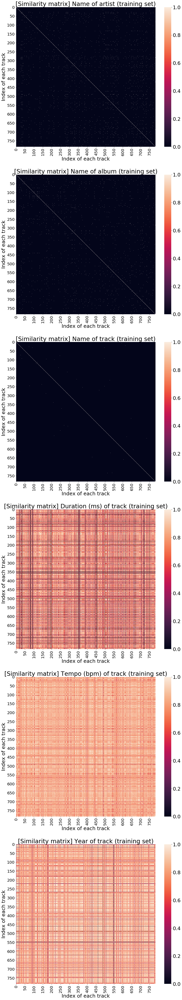

In [308]:
feature_list = ["Name of artist", "Name of album", "Name of track", "Duration (ms) of track", 
                "Tempo (bpm) of track", "Year of track"]

# feature_list = ["[Similarity matrix] Name of artist (training set)", "Name of album (training set)", 'Name of track (training set)', 
#                 'Duration of track (training set)', 'Bpm of track (training set)', 'Year of track (training set)']

fig, ax = plt.subplots(len(feature_list), 1, figsize=(16, 90))

for cnt in range(len(feature_list)):
    ax[cnt].set_aspect(1)
    plot_heatmap(sim_mat[:,:,cnt], '[Similarity matrix] ' + feature_list[cnt] + ' (training set)', ax[cnt])
#     if cnt == 1:
#         plot_heatmap(sim_mat[:,:,cnt], feature_list[cnt], ax[cnt//2, cnt%2], True)
#     else:
#         plot_heatmap(sim_mat[:,:,cnt], feature_list[cnt], ax[cnt//2, cnt%2])

**[Notes]**
- All these similarity matrices are from the randomized order of track. <br>
- Thus, each playlist is splitted to random index of these matrices. <br>
- If we can plot similarity matrix with non-randomized order of track, we might be able to see the chunk of patterns for submatrix in the diagonal, because all the tracks from the same playlist will be placed adjacently. <br>
- Let's draw this with full data set. <br>

### [2] Full data set (Training + Test)

In [309]:
sim_mat_full = np.zeros([len(playlists_df), len(playlists_df), len(str_feature_list) + len(numeric_feature_list)])

cnt = 0
for str_feature in str_feature_list:
    sim_mat_full[:, :, cnt], multiple_str_cnt = make_similarity_matrix_str(playlists_df[str_feature].values)
    cnt += 1

for numeric_feature in numeric_feature_list:
    if numeric_feature != 'duration_ms':
        sim_mat_full[:, :, cnt] = make_similarity_matrix_numeric(playlists_df[numeric_feature].values)
    else:
        sim_mat_full[:, :, cnt] = make_similarity_matrix_numeric(playlists_df[numeric_feature].values, 5.0)
    cnt += 1

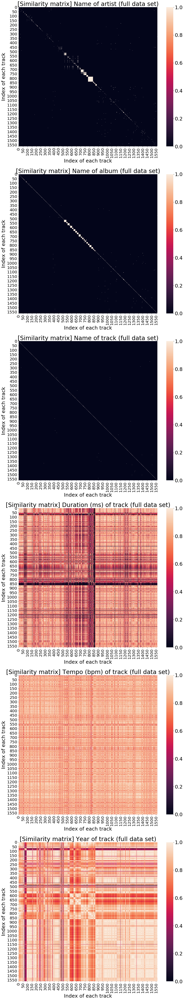

In [310]:
fig, ax = plt.subplots(len(feature_list), 1, figsize=(16, 90))

for cnt in range(len(feature_list)):
    ax[cnt].set_aspect(1)
    plot_heatmap(sim_mat_full[:,:,cnt], '[Similarity matrix] ' + feature_list[cnt] + ' (full data set)', ax[cnt])

**[Notes]**
- In this time, we can see some patterns in the similarity matrix. <br>
- This is from the full data set (training + test set). <br>
- You can see that the chunk of tracks from the same playlist have the same (or similar) features. <br>

## 2) EDA

### [1] Global properties

In [311]:
feature_lists = ["year", "danceability", "energy", "key", "loudness", "mode", "speechiness", "acousticness", 
                "instrumentalness", "liveness", "valence", "tempo", "time_signature", "popularity"]

genre_lists = sp.recommendation_genre_seeds()['genres']

print("The list of genre is as follows : \n")
print(genre_lists)

# genre_lists = ['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient', 'anime', 'black-metal', 'bluegrass', 
#                'blues', 'bossanova', 'brazil', 'breakbeat', 'british', 'cantopop', 'chicago-house', 'children', 
#                'chill', 'classical', 'club', 'comedy', 'country', 'dance', 'dancehall', 'death-metal', 'deep-house', 
#                'detroit-techno', 'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm', 'electro', 
#                'electronic', 'emo', 'folk', 'forro', 'french', 'funk', 'garage', 'german', 'gospel', 'goth', 
#                'grindcore', 'groove', 'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle', 
#                'heavy-metal', 'hip-hop', 'holidays', 'honky-tonk', 'house', 'idm', 'indian', 'indie', 
#                'indie-pop', 'industrial', 'iranian', 'j-dance', 'j-idol', 'j-pop', 'j-rock', 'jazz', 'k-pop', 
#                'kids', 'latin', 'latino', 'malay', 'mandopop', 'metal', 'metal-misc', 'metalcore', 'minimal-techno', 
#                'movies', 'mpb', 'new-age', 'new-release', 'opera', 'pagode', 'party', 'philippines-opm', 'piano', 
#                'pop', 'pop-film', 'post-dubstep', 'power-pop', 'progressive-house', 'psych-rock', 'punk', 
#                'punk-rock', 'r-n-b', 'rainy-day', 'reggae', 'reggaeton', 'road-trip', 'rock', 'rock-n-roll', 
#                'rockabilly', 'romance', 'sad', 'salsa', 'samba', 'sertanejo', 'show-tunes', 'singer-songwriter', 
#                'ska', 'sleep', 'songwriter', 'soul', 'soundtracks', 'spanish', 'study', 'summer', 'swedish', 
#                'synth-pop', 'tango', 'techno', 'trance', 'trip-hop', 'turkish', 'work-out', 'world-music']

The list of genre is as follows : 

['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient', 'anime', 'black-metal', 'bluegrass', 'blues', 'bossanova', 'brazil', 'breakbeat', 'british', 'cantopop', 'chicago-house', 'children', 'chill', 'classical', 'club', 'comedy', 'country', 'dance', 'dancehall', 'death-metal', 'deep-house', 'detroit-techno', 'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm', 'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk', 'garage', 'german', 'gospel', 'goth', 'grindcore', 'groove', 'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle', 'heavy-metal', 'hip-hop', 'holidays', 'honky-tonk', 'house', 'idm', 'indian', 'indie', 'indie-pop', 'industrial', 'iranian', 'j-dance', 'j-idol', 'j-pop', 'j-rock', 'jazz', 'k-pop', 'kids', 'latin', 'latino', 'malay', 'mandopop', 'metal', 'metal-misc', 'metalcore', 'minimal-techno', 'movies', 'mpb', 'new-age', 'new-release', 'opera', 'pagode', 'party', 'philippines-opm', 'piano', 'pop', '

In [312]:
def draw_histogram(ax_arg, feature_arg, label_arg : str, xlabel_arg : str, color_arg : str = 'b', 
                   show_ylabel_arg : bool = False, show_legend_arg : bool = False):
    '''
    Input
        ax_arg : axis of the plot
        feature_arg : feature data of which we will draw distribution
        label_arg : label of the plot
        xlabel_arg : xlabel of the plot
        color_arg : color of the plot
        show_ylabel_arg : if true, show ylabel
        show_legend_arg : if true, show legend
    '''
    if (show_legend_arg):
        ax_arg.hist(feature_arg, color = color_arg, alpha = 0.25, label = label_arg)
    else:
        ax_arg.hist(feature_arg, color = color_arg, alpha = 0.25)
    
    # Update ticklabel size
    ax_arg.tick_params(labelsize = 20)

    # Make labels
#     ax.set_title('', fontsize = 25)
    ax_arg.set_xlabel(xlabel_arg, fontsize = 25)
    if (show_ylabel_arg):
        ax_arg.set_ylabel('Distribution', fontsize = 25)
    if (show_legend_arg):
        ax_arg.legend(bbox_to_anchor=(1, 1),loc='upper left', ncol = 1, fontsize = 25);

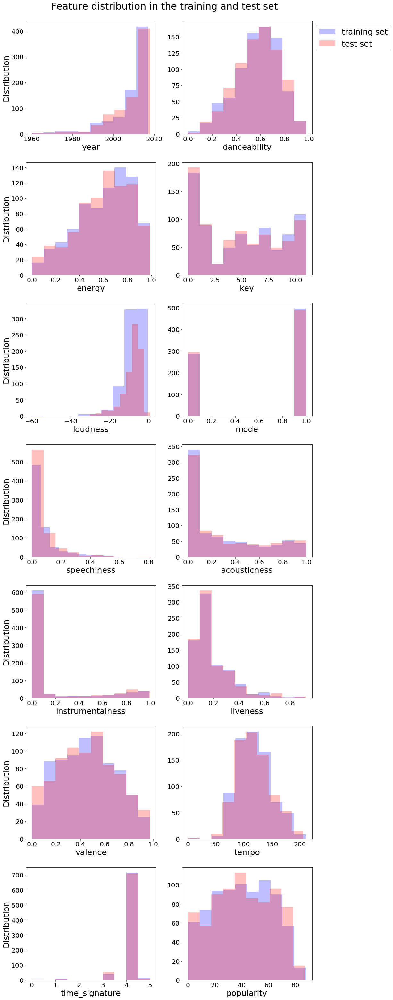

In [313]:
fig, ax = plt.subplots(7, 2, figsize = (16, 55))
plt.subplots_adjust(hspace = 0.25)

cnt = 0
for feature_ele in feature_lists:
    if cnt%2 == 0:
        show_ylabel = True
    else:
        show_ylabel = False
    
    if (cnt%2 == 1) and (cnt//2 ==0):
        show_legend = True
    else:
        show_legend = False
    
    draw_histogram(ax[cnt//2, cnt%2], pl_train_df[feature_lists[cnt]], 'training set', feature_lists[cnt],
                   'b', show_ylabel, show_legend)
    draw_histogram(ax[cnt//2, cnt%2], pl_test_df[feature_lists[cnt]], 'test set', feature_lists[cnt],
                   'r', show_ylabel, show_legend)
    cnt +=1

fig.suptitle('Feature distribution in the training and test set', fontsize=30, y = 0.895);

In [314]:
def draw_inter_dependencies(feature_arg, title_arg : str):
    '''
    Input
        feature_arg : feature data of which we will draw distribution
        title_arg : title of the plot
    '''
    ax = scatter_matrix(feature_arg, alpha=0.2, figsize=(18,20), diagonal='kde', range_padding = 0.25)

    for aa in np.arange(ax.shape[0]):
        for bb in np.arange(ax.shape[1]):
            ax[aa,bb].tick_params(labelsize=12)
            ax[aa,bb].tick_params(axis='both', labelrotation=45)
            ax[aa,bb].xaxis.label.set_size(15)
            ax[aa,bb].yaxis.label.set_size(15)
            
            if (bb % 2 == 0):
    #             ax[aa,bb].xaxis.label.set_va('top')
                ax[aa,bb].xaxis.set_label_coords(0.5,-0.5)
            else:
    #             ax[aa,bb].xaxis.label.set_va('bottom')
                ax[aa,bb].xaxis.set_label_coords(0.5,-0.75)
            if (aa % 2 == 0):
    #             ax[aa,bb].yaxis.label.set_va('top')
                ax[aa,bb].yaxis.set_label_coords(-0.75,0.5)
            else:
    #             ax[aa,bb].yaxis.label.set_va('bottom')
                ax[aa,bb].yaxis.set_label_coords(-1.0,0.5)

    plt.suptitle(title_arg, fontsize=25,y=0.9);

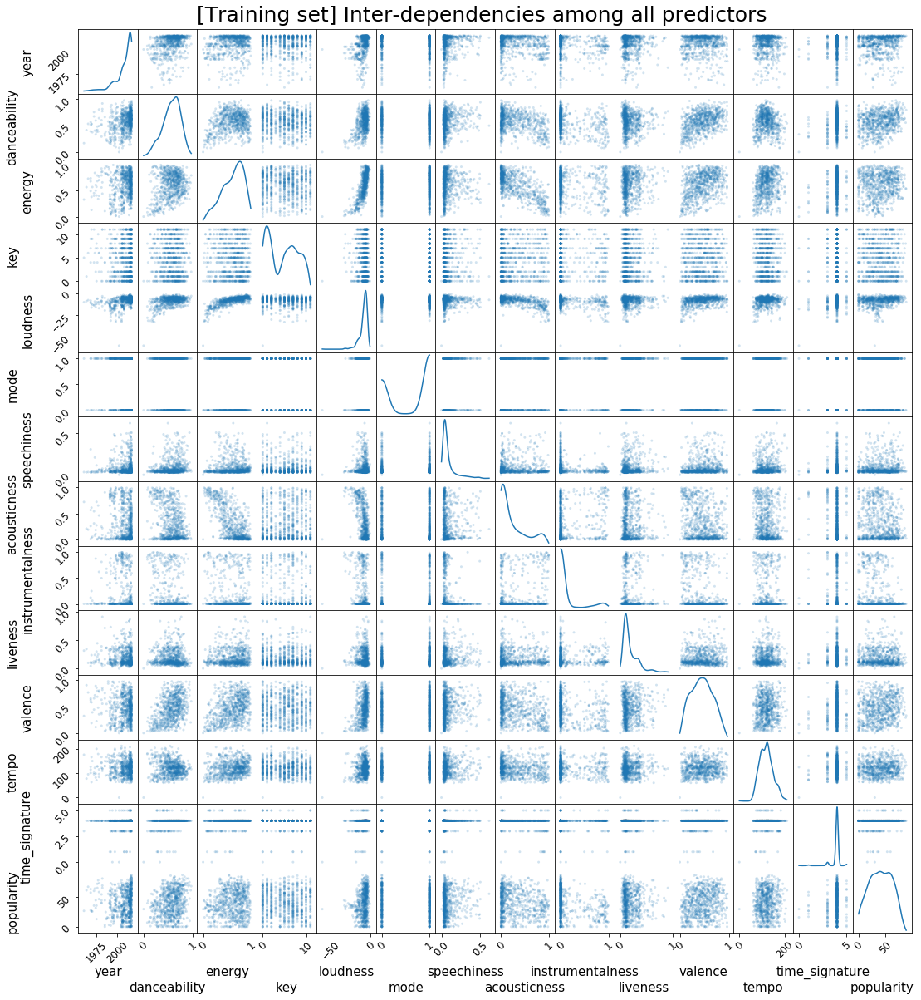

In [315]:
draw_inter_dependencies(pl_train_df[feature_lists], '[Training set] Inter-dependencies among all predictors')

In [316]:
# draw_inter_dependencies(pl_test_df[feature_lists], '[Test set] Inter-dependencies among all predictors')

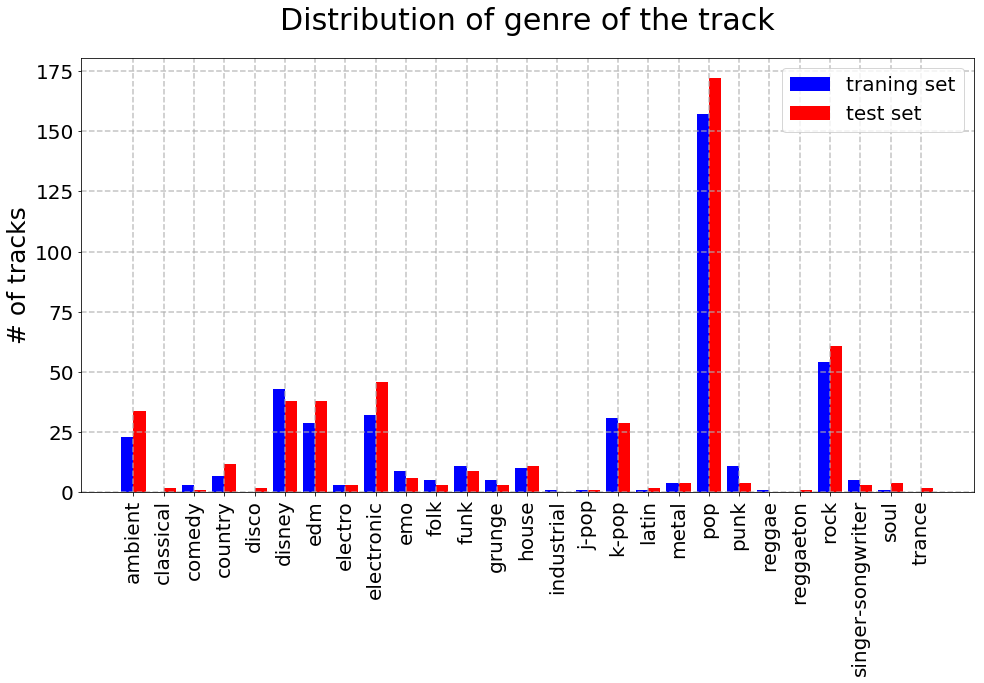

In [317]:
nonzero_genre_temp = (np.sum(playlists_df[genre_lists]) != 0)
nonzero_genre = [ele for ele in nonzero_genre_temp[nonzero_genre_temp.values].index]



fig, ax = plt.subplots(1, 1, figsize = (16, 8))

ind = np.arange(len(nonzero_genre)) # the x locations for the groups
width = 0.4         # the width of the bars
ax.bar(ind-width/2, pl_train_df[nonzero_genre].sum().values, width, color='b', label = 'traning set')
ax.bar(ind+width/2, pl_test_df[nonzero_genre].sum().values, width, color='r', label = 'test set')

# Update ticklabel size
ax.tick_params(labelsize = 20)
ax.tick_params(axis='x', rotation = 90)
ax.set_xticks(ind)

# Make labels
ax.set_ylabel('# of tracks',fontsize=25)
ax.set_xticklabels(nonzero_genre, fontsize=10)

ax.legend(fontsize=20)
# ax.tick_params(axis='both', which='both', length=0)
ax.grid(True, lw =  1.5, ls = '--', alpha = 0.75)
ax.set_title('Distribution of genre of the track', fontsize=30, y = 1.05);

### [2] Group properties

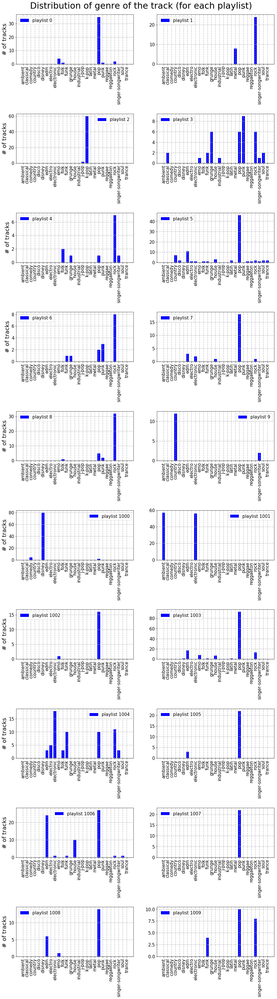

In [318]:
fig, ax = plt.subplots(10, 2, figsize = (16, 60))
plt.subplots_adjust(hspace = 1.0)

ind = np.arange(len(nonzero_genre)) # the x locations for the groups
width = 0.7         # the width of the bars

cnt = 0
for pid in playlists_df.groupby('pid').sum()[nonzero_genre].index:
#     print(playlists_df.groupby('pid').sum()[nonzero_genre].loc[pid].values)
    
    ax_temp = ax[cnt//2, cnt%2]
    
    ax_temp.bar(ind, playlists_df.groupby('pid').sum()[nonzero_genre].loc[pid].values, 
           width, color='b', label = 'playlist ' + str(pid))
    
    # Update ticklabel size
    ax_temp.tick_params(labelsize = 15)
    ax_temp.tick_params(axis='x', rotation = 90)
    if cnt == len(nonzero_genre)-1:
        ax_temp.set_xticks(ind)
    
    # Make labels
    if cnt%2 == 0:
        ax_temp.set_ylabel('# of tracks',fontsize=20)
    ax_temp.set_xticks(ind)
    ax_temp.set_xticklabels(nonzero_genre, fontsize=10)
    
    ax_temp.legend(fontsize=15)
    ax_temp.grid(True, lw =  1.5, ls = '--', alpha = 0.75)
    
    cnt += 1

fig.suptitle('Distribution of genre of the track (for each playlist)', fontsize=30, y = 0.89);

**[Notes]**
- The above barplot is the distribution of genre of the track for each playlist. <br>
As you can see, each playlist is highly dependent on the genre of the track. <br>
Large portion of the playlist is consisted of only several genre of the track, meaning that the genre will be pretty important feature to continue the playlist. <br>

## 3) Standardization

In [319]:
print('Scaler is as follows.')
scaler = MinMaxScaler().fit(pl_train_df[feature_lists])
display(pd.DataFrame({'min': scaler.min_, 'scale': scaler.scale_, 
                      'data_min' : scaler.data_min_, 'data_max' : scaler.data_max_}, index = feature_lists).T)
# scaler = StandardScaler().fit(practice_X_train[feature_lists])
# display(pd.DataFrame({'mean': scaler.mean_, 'variance': scaler.var_}, index = feature_lists).T)

Scaler is as follows.


,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,popularity
min,-34.385965,0.000000,0.000000,0.000000,1.009812,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
scale,0.017544,1.022495,1.014199,0.090909,0.016830,1.0,1.615509,1.005025,1.006036,1.094092,1.028807,0.004745,0.2,0.011364
data_min,1960.000000,0.000000,0.000000,0.000000,-60.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
data_max,2017.000000,0.978000,0.986000,11.000000,-0.583000,1.0,0.619000,0.995000,0.994000,0.914000,0.972000,210.750000,5.0,88.000000


In [320]:
def scale_columns(df_arg, scaler_arg, col_arg: list):
    '''
        input
            df_arg : data_frame
            scaler_arg : StandardScaler object containing the information (min, max) of columns of training set
            col_arg : a list of columns
        output
            scaled_df : standardized data_frame
    '''
    # copy the dataframe in order not to affect to original data frame 
    scaled_df = df_arg.copy()
    scaled_df[col_arg] = scaler_arg.transform(df_arg[col_arg])
    
    return scaled_df

In [321]:
scaled_pl_train_df = scale_columns(pl_train_df, scaler, feature_lists)
scaled_pl_test_df = scale_columns(pl_test_df, scaler, feature_lists)

print('1. [Training set]\n')
print('Before Standardization')
display(pl_train_df.describe())

print('After Standardization')
display(scaled_pl_train_df.describe())

print('2. [Test set]\n')
print('Before Standardization')
display(pl_test_df.describe())

print('After Standardization')
display(scaled_pl_test_df.describe())

1. [Training set]

Before Standardization


,duration_ms,modified_at,num_albums,num_artists,num_edits,num_followers,num_tracks,pid,playlist_duration_ms,pos,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,popularity,acoustic,afrobeat,alt-rock,alternative,ambient,anime,black-metal,bluegrass,blues,bossanova,brazil,breakbeat,british,cantopop,chicago-house,children,chill,classical,club,comedy,country,dance,dancehall,death-metal,deep-house,detroit-techno,...,minimal-techno,movies,mpb,new-age,new-release,opera,pagode,party,philippines-opm,piano,pop,pop-film,post-dubstep,power-pop,progressive-house,psych-rock,punk,punk-rock,r-n-b,rainy-day,reggae,reggaeton,road-trip,rock,rock-n-roll,rockabilly,romance,sad,salsa,samba,sertanejo,show-tunes,singer-songwriter,ska,sleep,songwriter,soul,soundtracks,spanish,study,summer,swedish,synth-pop,tango,techno,trance,trip-hop,turkish,work-out,world-music
count,7.830000e+02,7.830000e+02,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,7.830000e+02,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.000000,783.0,783.0,783.0,783.0,783.0,...,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.000000,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0
mean,2.247170e+05,1.480989e+09,75.643678,66.927203,30.660281,1.446999,125.877395,676.644955,2.798753e+07,62.330779,2008.561941,0.574098,0.604803,5.072797,-8.466807,0.633461,0.087888,0.297286,0.144640,0.188178,0.457480,119.273286,3.927203,40.655172,0.0,0.0,0.0,0.0,0.029374,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003831,0.008940,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.200511,0.0,0.0,0.0,0.0,0.0,0.014049,0.0,0.0,0.0,0.001277,0.0,0.0,0.068966,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006386,0.0,0.0,0.0,0.001277,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,9.095913e+04,3.145557e+07,59.589426,45.534210,33.049247,0.595755,66.833440,469.145732,1.476598e+07,53.260703,10.105375,0.178121,0.229726,3.593980,5.127288,0.482167,0.092867,0.312825,0.293806,0.141470,0.230266,29.356883,0.447857,21.536708,0.0,0.0,0.0,0.0,0.168961,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.061819,0.094188,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.400639,0.0,0.0,0.0,0.0,0.0,0.117766,0.0,0.0,0.0,0.035737,0.0,0.0,0.253557,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.079706,0.0,0.0,0.0,0.035737,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,2.854600e+04,1.401667e+09,14.000000,3.000000,2.000000,1.000000,16.000000,0.000000,3.408479e+06,0.000000,1960.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,1.865290e+05,1.457827e+09,18.000000,31.000000,4.000000,1.000000,64.000000,6.500000,1.403996e+07,19.000000,2006.000000,0.455500,0.439500,2.000000,-9.835000,0.000000,0.036350,0.026900,0.000000,0.094150,0.269500,98.666500,4.000000,24.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.

After Standardization


,duration_ms,modified_at,num_albums,num_artists,num_edits,num_followers,num_tracks,pid,playlist_duration_ms,pos,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,popularity,acoustic,afrobeat,alt-rock,alternative,ambient,anime,black-metal,bluegrass,blues,bossanova,brazil,breakbeat,british,cantopop,chicago-house,children,chill,classical,club,comedy,country,dance,dancehall,death-metal,deep-house,detroit-techno,...,minimal-techno,movies,mpb,new-age,new-release,opera,pagode,party,philippines-opm,piano,pop,pop-film,post-dubstep,power-pop,progressive-house,psych-rock,punk,punk-rock,r-n-b,rainy-day,reggae,reggaeton,road-trip,rock,rock-n-roll,rockabilly,romance,sad,salsa,samba,sertanejo,show-tunes,singer-songwriter,ska,sleep,songwriter,soul,soundtracks,spanish,study,summer,swedish,synth-pop,tango,techno,trance,trip-hop,turkish,work-out,world-music
count,7.830000e+02,7.830000e+02,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,7.830000e+02,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.000000,783.0,783.0,783.0,783.0,783.0,...,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.000000,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0
mean,2.247170e+05,1.480989e+09,75.643678,66.927203,30.660281,1.446999,125.877395,676.644955,2.798753e+07,62.330779,0.851964,0.587013,0.613391,0.461163,0.867314,0.633461,0.141984,0.298780,0.145513,0.205884,0.470658,0.565947,0.785441,0.461991,0.0,0.0,0.0,0.0,0.029374,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003831,0.008940,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.200511,0.0,0.0,0.0,0.0,0.0,0.014049,0.0,0.0,0.0,0.001277,0.0,0.0,0.068966,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006386,0.0,0.0,0.0,0.001277,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,9.095913e+04,3.145557e+07,59.589426,45.534210,33.049247,0.595755,66.833440,469.145732,1.476598e+07,53.260703,0.177287,0.182128,0.232988,0.326725,0.086293,0.482167,0.150028,0.314397,0.295579,0.154781,0.236899,0.139297,0.089571,0.244735,0.0,0.0,0.0,0.0,0.168961,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.061819,0.094188,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.400639,0.0,0.0,0.0,0.0,0.0,0.117766,0.0,0.0,0.0,0.035737,0.0,0.0,0.253557,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.079706,0.0,0.0,0.0,0.035737,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,2.854600e+04,1.401667e+09,14.000000,3.000000,2.000000,1.000000,16.000000,0.000000,3.408479e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,1.865290e+05,1.457827e+09,18.000000,31.000000,4.000000,1.000000,64.000000,6.500000,1.403996e+07,19.000000,0.807018,0.465746,0.445740,0.181818,0.844287,0.000000,0.058724,0.027035,0.000000,0.103009,0.277263,0.468168,0.800000,0.272727,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.

2. [Test set]

Before Standardization


,duration_ms,modified_at,num_albums,num_artists,num_edits,num_followers,num_tracks,pid,playlist_duration_ms,pos,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,popularity,acoustic,afrobeat,alt-rock,alternative,ambient,anime,black-metal,bluegrass,blues,bossanova,brazil,breakbeat,british,cantopop,chicago-house,children,chill,classical,club,comedy,country,dance,dancehall,death-metal,deep-house,detroit-techno,...,minimal-techno,movies,mpb,new-age,new-release,opera,pagode,party,philippines-opm,piano,pop,pop-film,post-dubstep,power-pop,progressive-house,psych-rock,punk,punk-rock,r-n-b,rainy-day,reggae,reggaeton,road-trip,rock,rock-n-roll,rockabilly,romance,sad,salsa,samba,sertanejo,show-tunes,singer-songwriter,ska,sleep,songwriter,soul,soundtracks,spanish,study,summer,swedish,synth-pop,tango,techno,trance,trip-hop,turkish,work-out,world-music
count,7.830000e+02,7.830000e+02,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,7.830000e+02,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.000000,783.000000,783.0,783.0,783.0,783.0,783.0,...,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.000000,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0
mean,2.268377e+05,1.481075e+09,75.735632,66.961686,30.681992,1.448276,125.563218,674.106003,2.792681e+07,62.389527,2008.908046,0.576791,0.594078,4.860792,-8.643464,0.623244,0.084675,0.308813,0.167277,0.186001,0.455536,118.238964,3.914432,41.157088,0.0,0.0,0.0,0.0,0.043423,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.002554,0.0,0.001277,0.015326,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.219668,0.0,0.0,0.0,0.0,0.0,0.005109,0.0,0.0,0.0,0.0,0.001277,0.0,0.077905,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003831,0.0,0.0,0.0,0.005109,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.002554,0.0,0.0,0.0,0.0
std,8.645908e+04,3.150651e+07,59.720216,45.645706,33.070293,0.595867,67.054475,470.092533,1.481388e+07,52.805780,9.424039,0.180394,0.231964,3.513552,4.938352,0.484883,0.089967,0.319385,0.313130,0.142421,0.239250,29.831946,0.418967,21.926863,0.0,0.0,0.0,0.0,0.203937,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.050508,0.0,0.035737,0.122923,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.414286,0.0,0.0,0.0,0.0,0.0,0.071337,0.0,0.0,0.0,0.0,0.035737,0.0,0.268194,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.061819,0.0,0.0,0.0,0.071337,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.050508,0.0,0.0,0.0,0.0
min,6.000000e+03,1.401667e+09,14.000000,3.000000,2.000000,1.000000,16.000000,0.000000,3.408479e+06,0.000000,1960.000000,0.000000,0.002810,0.000000,-30.354000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
25%,1.844265e+05,1.457827e+09,18.000000,31.000000,4.000000,1.000000,64.000000,6.000000,1.403996e+07,20.000000,2005.000000,0.454000,0.449000,2.000000,-10.681000,0.000000,0.036550,0.028700,0.000000,0.094150,0.271500,96.896500,4.000000,25.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0

After Standardization


,duration_ms,modified_at,num_albums,num_artists,num_edits,num_followers,num_tracks,pid,playlist_duration_ms,pos,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,popularity,acoustic,afrobeat,alt-rock,alternative,ambient,anime,black-metal,bluegrass,blues,bossanova,brazil,breakbeat,british,cantopop,chicago-house,children,chill,classical,club,comedy,country,dance,dancehall,death-metal,deep-house,detroit-techno,...,minimal-techno,movies,mpb,new-age,new-release,opera,pagode,party,philippines-opm,piano,pop,pop-film,post-dubstep,power-pop,progressive-house,psych-rock,punk,punk-rock,r-n-b,rainy-day,reggae,reggaeton,road-trip,rock,rock-n-roll,rockabilly,romance,sad,salsa,samba,sertanejo,show-tunes,singer-songwriter,ska,sleep,songwriter,soul,soundtracks,spanish,study,summer,swedish,synth-pop,tango,techno,trance,trip-hop,turkish,work-out,world-music
count,7.830000e+02,7.830000e+02,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,7.830000e+02,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.000000,783.000000,783.0,783.0,783.0,783.0,783.0,...,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.000000,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.0,783.000000,783.0,783.0,783.0,783.0
mean,2.268377e+05,1.481075e+09,75.735632,66.961686,30.681992,1.448276,125.563218,674.106003,2.792681e+07,62.389527,0.858036,0.589766,0.602513,0.441890,0.864341,0.623244,0.136793,0.310364,0.168286,0.203502,0.468659,0.561039,0.782886,0.467694,0.0,0.0,0.0,0.0,0.043423,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.002554,0.0,0.001277,0.015326,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.219668,0.0,0.0,0.0,0.0,0.0,0.005109,0.0,0.0,0.0,0.0,0.001277,0.0,0.077905,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003831,0.0,0.0,0.0,0.005109,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.002554,0.0,0.0,0.0,0.0
std,8.645908e+04,3.150651e+07,59.720216,45.645706,33.070293,0.595867,67.054475,470.092533,1.481388e+07,52.805780,0.165334,0.184452,0.235258,0.319414,0.083113,0.484883,0.145342,0.320990,0.315020,0.155821,0.246142,0.141551,0.083793,0.249169,0.0,0.0,0.0,0.0,0.203937,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.050508,0.0,0.035737,0.122923,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.414286,0.0,0.0,0.0,0.0,0.0,0.071337,0.0,0.0,0.0,0.0,0.035737,0.0,0.268194,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.061819,0.0,0.0,0.0,0.071337,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.050508,0.0,0.0,0.0,0.0
min,6.000000e+03,1.401667e+09,14.000000,3.000000,2.000000,1.000000,16.000000,0.000000,3.408479e+06,0.000000,0.000000,0.000000,0.002850,0.000000,0.498948,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
25%,1.844265e+05,1.457827e+09,18.000000,31.000000,4.000000,1.000000,64.000000,6.000000,1.403996e+07,20.000000,0.789474,0.464213,0.455375,0.181818,0.830049,0.000000,0.059047,0.028844,0.000000,0.103009,0.279321,0.459770,0.800000,0.284091,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.

## 4) Multi-dimensional scaling

In [322]:
eff_columns = []
eff_columns.extend(feature_lists)
eff_columns.extend(genre_lists)

embedding = MDS(n_components=2, n_jobs = -1)
MDS_pl_train = embedding.fit_transform(scaled_pl_train_df[eff_columns])
print('[Result of Multi-Dimensional Scaling (MDS)]')
print(f'Shape of MDS_pl_train : {MDS_pl_train.shape}')

[Result of Multi-Dimensional Scaling (MDS)]
Shape of MDS_pl_train : (783, 2)


In [323]:
def plot_MDS_result(MDS_arg, y_train_arg, class_arg):
    '''
    Input
        MDS_arg : 2 dimensional feature spaces
        y_train_arg : label of each data point
        class_arg : list of class
    '''
    marker_list = ['.','o','^','^','<','>','1','2','3','4','8','s','p','P','*','+','x','X','D','d']
    
    fig, ax = plt.subplots(1, 1, figsize = (12, 12))
    
    cnt = 0
    for class_ele in class_arg:
        ax.scatter(MDS_arg[y_train_arg == class_ele, 0], MDS_arg[y_train_arg == class_ele, 1], 
                   s = 100, alpha = 0.75, edgecolors = 'k', linewidth = 1.5, marker = marker_list[cnt], 
                   label = 'Playlist ' + str(class_ele))
        cnt += 1
    
    # Update ticklabel size
    ax.tick_params(labelsize = 20)
    
    # Make labels
    ax.set_title(f'Visualization of {len(MDS_arg)} tracks in {len(class_arg)} playlists using MDS', fontsize = 30)
    
    ax.set_xlabel('1st Feature', fontsize = 25)
    ax.set_ylabel('2nd Feature', fontsize = 25)
    ax.legend(bbox_to_anchor=(1, 1),loc='upper left', ncol = 1, fontsize = 20)

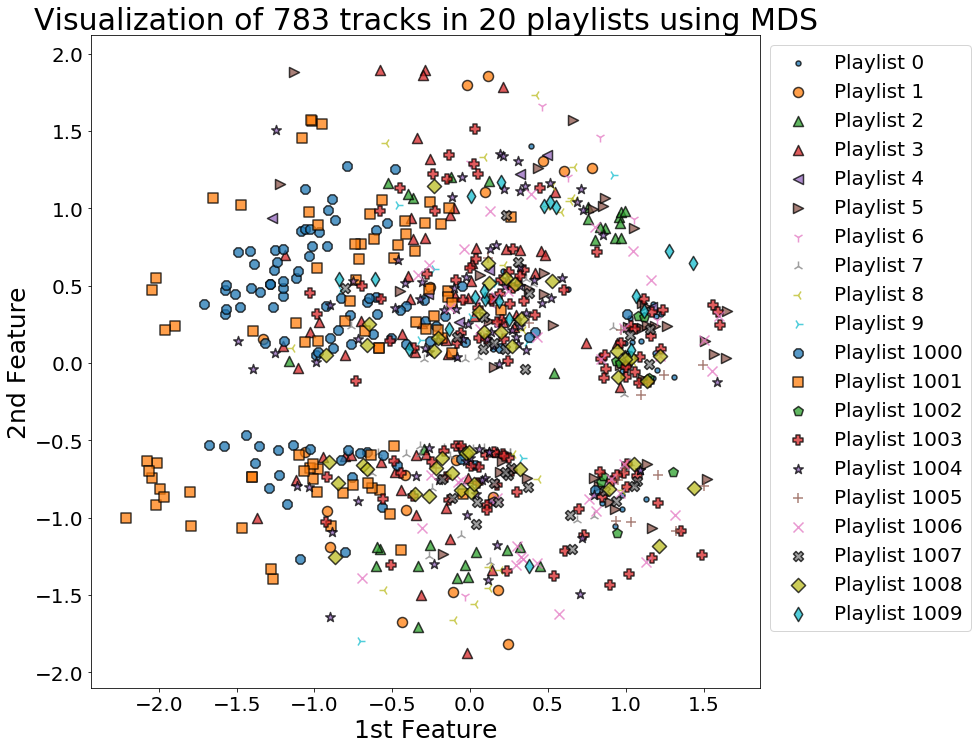

In [324]:
class_lists = np.unique(scaled_pl_train_df['pid'].values)
y_train = scaled_pl_train_df['pid'].values
y_test = scaled_pl_test_df['pid'].values

plot_MDS_result(MDS_pl_train, y_train, class_lists)

# 4. [Models]
## 1) Base model - k nearest neighbors (k-NN)

In [325]:
X_train = scaled_pl_train_df[eff_columns]
X_test = scaled_pl_test_df[eff_columns]

knn_model = KNeighborsClassifier(n_jobs = -1)
knn_model.fit(X_train, y_train)
print("[k-NN result (k=5)]")
print(f"Training accuracy: {knn_model.score(X_train, y_train) * 100.0:.2f} %")
print(f"Test accuracy: {knn_model.score(X_test, y_test) * 100.0:.2f} %")

[k-NN result (k=5)]
Training accuracy: 57.60 %
Test accuracy: 42.27 %


## 2) k-NN with Cross Validation (CV)

In [326]:
# KNN with 5-fold crossvalidation - with GridSearchCV

KFold_k = 5
k_list = np.arange(1, 100, 2)

est = KNeighborsClassifier(n_jobs = -1)
parameters = {'n_neighbors': k_list}
gs = GridSearchCV(est, param_grid=parameters, cv=KFold_k, scoring="accuracy")
gs.fit(X_train, y_train)

print("[k-NN with CV result]")
print(gs.best_estimator_, "\n")
print(gs.best_params_, "\n")
print(gs.best_score_, "\n")

[k-NN with CV result]
KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=-1, n_neighbors=15, p=2,
           weights='uniform') 

{'n_neighbors': 15} 

0.41379310344827586 



/Users/jinsookim/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


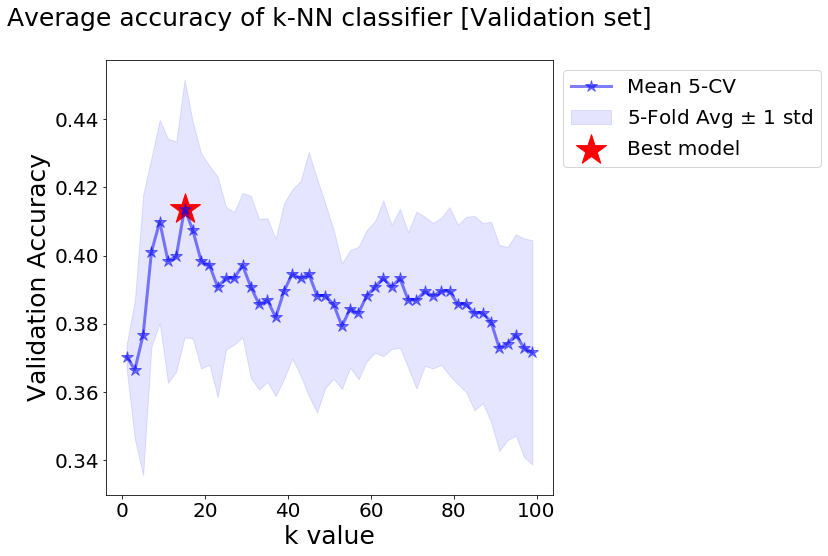

In [327]:
best_idx = gs.cv_results_['mean_test_score'].argmax()

fig, ax = plt.subplots(1, 1, figsize = (8,8)) 

# for fold in range(KFold_k):
#     key = 'split' + str(fold) + '_test_score'
#     ax.plot(k_list, gs.cv_results_[key], 'b', lw = 1, linestyle = '--', label = f'Fold {fold+1}')


ax.fill_between(k_list, gs.cv_results_['mean_test_score'] + gs.cv_results_['std_test_score'], 
                gs.cv_results_['mean_test_score'] - gs.cv_results_['std_test_score'], color = 'b', alpha = 0.1,
                label = f'5-Fold Avg $\pm$ 1 std')
ax.plot(k_list, gs.cv_results_['mean_test_score'], '*-', color = 'b', linewidth = 3, markersize = 12, 
        alpha = 0.5, label = 'Mean 5-CV')

# ax.plot(k_list, gs.cv_results_['mean_test_score'], 'r', lw = 3, label = '5-Fold Avg')
# ax.plot(k_list, gs.cv_results_['mean_test_score'] + gs.cv_results_['std_test_score'], 'r', lw = 1, linestyle = '--', 
#         label = f'5-Fold Avg $\pm$ 1 std')
# ax.plot(k_list, gs.cv_results_['mean_test_score'] - gs.cv_results_['std_test_score'], 'r', lw = 1, linestyle = '--')

ax.scatter(k_list[best_idx], gs.cv_results_['mean_test_score'][best_idx], color="r", marker="*", s=1000, 
           label="Best model")

# Update ticklabel size
ax.tick_params(labelsize = 20)

# Make labels
ax.set_title('Average accuracy of k-NN classifier [Validation set]\n', fontsize = 25) 
ax.set_xlabel('k value', fontsize = 25)
ax.set_ylabel('Validation Accuracy', fontsize = 25)
ax.legend(bbox_to_anchor=(1, 1),loc='upper left', ncol = 1, fontsize = 20)

In [328]:
knn_model = KNeighborsClassifier(n_neighbors = gs.best_params_['n_neighbors'], n_jobs = -1)
knn_model.fit(X_train, y_train)
print(f"[k-NN from CV result (k={gs.best_params_['n_neighbors']})]")
print(f"Training accuracy: {knn_model.score(X_train, y_train) * 100.0:.2f} %")
print(f"Test accuracy: {knn_model.score(X_test, y_test) * 100.0:.2f} %")

[k-NN from CV result (k=15)]
Training accuracy: 48.91 %
Test accuracy: 41.38 %


# 5. [Reference]

> [1] Berenzweig, Adam, Beth Logan, Daniel P.W. Ellis and Brian Whitman. A Large-Scale Evaluation of Acoustic and Subjective Music Similarity Measures. Proceedings of the ISMIR International Conference on Music Information Retrieval (Baltimore, MD), 2003, pp. 99:105. <br>
[2] Logan, B., A Content-Based Music Similarity Function, (Report CRL 2001/02) Compaq Computer Corporation Cambridge Research Laboratory, Technical Report Series (Jun. 2001). <br>
[3] Shedl, M. et al, Current Challenges and Visions in Music Recommender Systems Research, https://arxiv.org/pdf/1710.03208.pdf. <br>
[4] Shedl, M., Peter Knees, and Fabien Gouyon, New Paths in Music Recommender Systems, RecSys’17 tutorial, http://www.cp.jku.at/tutorials/mrs_recsys_2017/slides.pdf <br>